# **Problem 1: Regression** ``(20 pt.)``
## 1.1 Linear Regression

---
Follow this steps:

1. Write function `generate_linear_data` that generates  sample points $(x_i, y_i)$ where $$y_i = ax_i + b + \epsilon_i$$ $\epsilon_i$ is an error term (measurement error etc.) added to $y_i$ and is modeled by random variables: $\epsilon_i \stackrel{iid}{\sim} \mathcal{N}(0, 1) $
2. Fit a line using least square method that you learned during the course.
3. Evaluate the accuracy of your fit using `Mean Squared Error (MSE)` and `R² score`.
4. Create a scatter plot of the sample data alongside the fitted line.


Note that you shouldn't use any built-in function form np.linalg library.



<h1 align="center">Mathematical Methods in Engineering - Course Code: 25872</h1>
<h3 align="center">Instructor: Dr. Pilaram</h3>
<h4 align="center">Sharif University of Technology</h4>
<h4 align="center">Computer Assignment 2</h4>

<p align="center">For any questions, please contact <a href="https://t.me/imanf82">Iman Fakury</a>.</p>


Fitted line: y = 2.01x + -2.91
R² score: 0.9929, MSE: 0.8332


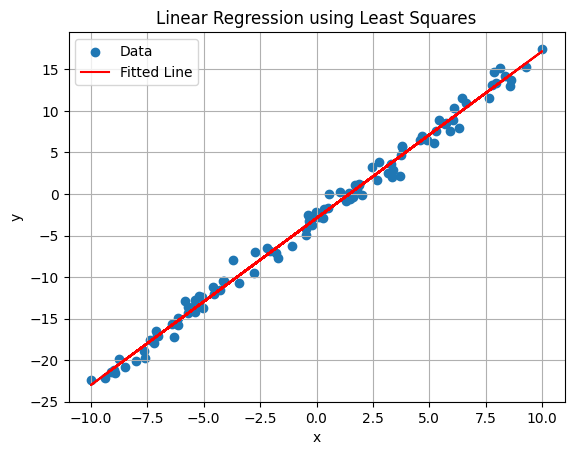

In [1]:
import numpy as np
import matplotlib.pyplot as plt

#generate_linear_data
def generate_linear_data(slope, intercept, num_points=100, noise_std=1.0):
    x = np.random.uniform(-10, 10, size=num_points)
    noise = np.random.normal(0, noise_std, size=num_points)
    y = slope * x + intercept + noise
    return x, y

#fitting the line
def fit_line(x, y):
    n = len(x)
    A = np.vstack([x, np.ones(n)]).T   # A = [x_i, 1]
    AT = A.T
    ATA = np.zeros((2, 2))
    for i in range(2):
        for j in range(2):
            ATA[i][j] = np.sum(AT[i] * A[:, j])
    ATb = np.array([np.sum(AT[0] * y), np.sum(AT[1] * y)])


    det = ATA[0][0]*ATA[1][1] - ATA[0][1]*ATA[1][0]
    inv_ATA = np.array([[ATA[1][1], -ATA[0][1]], [-ATA[1][0], ATA[0][0]]]) / det

    solution = inv_ATA @ ATb
    slope, intercept = solution[0], solution[1]
    return slope, intercept

# MSE و R^2
def evaluate_fit(y_true, y_pred):
    mse = np.mean((y_true - y_pred) ** 2)
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - np.mean(y_true)) ** 2)
    r2 = 1 - (ss_res / ss_tot)
    return r2, mse

#excample
true_slope = 2.0
true_intercept = -3.0
x, y = generate_linear_data(true_slope, true_intercept)

slope, intercept = fit_line(x, y)
y_pred = slope * x + intercept

r2, mse = evaluate_fit(y, y_pred)

print(f"Fitted line: y = {slope:.2f}x + {intercept:.2f}")
print(f"R² score: {r2:.4f}, MSE: {mse:.4f}")

#plot
plt.scatter(x, y, label='Data')
plt.plot(x, y_pred, color='red', label='Fitted Line')
plt.legend()
plt.title("Linear Regression using Least Squares")
plt.xlabel("x")
plt.ylabel("y")
plt.grid(True)
plt.show()


## 1.2 Polynomial Regression
Implement all the steps from the previous part in this section.

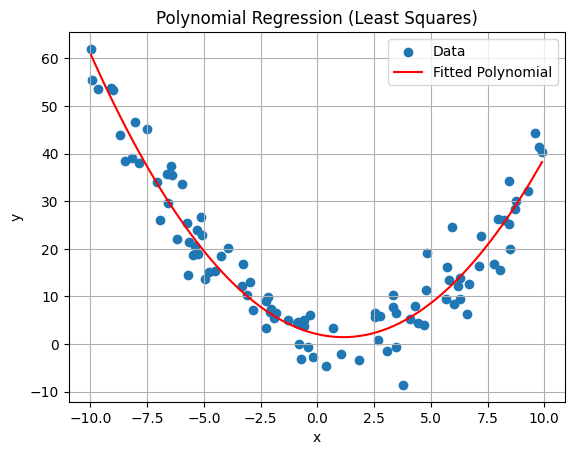

Fitted coefficients: [np.float64(2.077166695374706), np.float64(-1.0990555900330823), np.float64(0.4797253418674479)]


In [2]:
import numpy as np
import matplotlib.pyplot as plt

#generate polynomial data
def generate_polynomial_data(coeffs, num_points=100, noise_std=1.0):
    x = np.random.uniform(-10, 10, size=num_points)
    y_true = np.zeros_like(x)
    for i, c in enumerate(coeffs):
        y_true += c * x**i
    noise = np.random.normal(0, noise_std, size=num_points)
    y = y_true + noise
    return x, y

# least squares
#fit polynomial
def fit_polynomial(x, y, degree):
    A = np.vstack([x**i for i in range(degree+1)]).T
    AT = A.T
    ATA = np.zeros((degree+1, degree+1))
    for i in range(degree+1):
        for j in range(degree+1):
            ATA[i][j] = np.sum(AT[i] * A[:, j])
    ATb = np.array([np.sum(AT[i] * y) for i in range(degree+1)])
    coeffs = gaussian_elimination(ATA, ATb)
    return coeffs

def gaussian_elimination(A, b):
    n = len(b)
    # Augmented matrix
    M = [list(A[i]) + [b[i]] for i in range(n)]

    #eliminaion 
    for k in range(n):
        for i in range(k+1, n):
            factor = M[i][k] / M[k][k]
            for j in range(k, n+1):
                M[i][j] -= factor * M[k][j]

    x = [0] * n
    for i in range(n-1, -1, -1):
        x[i] = (M[i][-1] - sum(M[i][j] * x[j] for j in range(i+1, n))) / M[i][i]
    return x

#excample
coeffs_true = [2, -1, 0.5]  # y = 2 - x + 0.5x^2
x, y = generate_polynomial_data(coeffs_true, noise_std=5.0)
coeffs_fit = fit_polynomial(x, y, degree=2)

#forecast
x_line = np.linspace(min(x), max(x), 300)
y_line = sum(c * x_line**i for i, c in enumerate(coeffs_fit))

# plot
plt.scatter(x, y, label='Data')
plt.plot(x_line, y_line, color='red', label='Fitted Polynomial')
plt.title("Polynomial Regression (Least Squares)")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.grid(True)
plt.show()

# fitted coeff
print("Fitted coefficients:", coeffs_fit)


# **Problem 2: SVD for Compression** ``(30 pt.)``

---

In this question, we want to compress BMP images using SVD. BMP images are not compressed by default and the pixel information is stored in rather a simple format. Colored BMP files are composed of three matrices of size $n × m$ where $n$ and $m$ are the height and width of the image, respectively. Each matrix corresponds to one of the three colors Red, Green, and Blue. Each entry of these matrices is a number between 0 and 255 that specifies the intensity of the corresponding color. The final array is hence a 3D array of size $n × m × 3$.

---

### 2.1 Image display
Choose two arbitrary BMP files (it is recommended to use different subjects and sizes) and load it into a `numpy` array using the `imread` function. Then, show each image and display their shape.

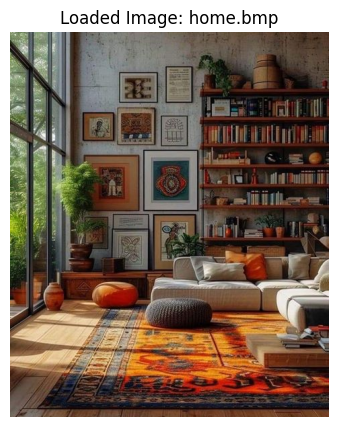


Image: home.bmp
Shape: (573, 474, 3)
Data type: uint8
Min value: 0
Max value: 255


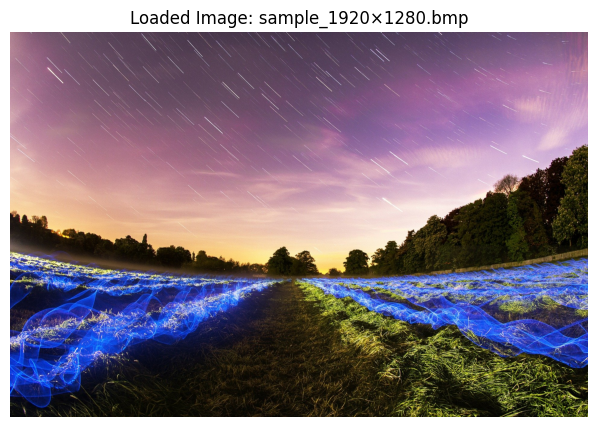


Image: sample_1920×1280.bmp
Shape: (1280, 1920, 3)
Data type: uint8
Min value: 0
Max value: 255


In [3]:
# Code cell
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Define image paths
image_paths = [
    r"C:\Users\ads\Downloads\home.bmp",
    r"C:\Users\ads\Downloads\sample_1920×1280.bmp"
]

# Process each image
for image_path in image_paths:
    # Load the image
    img = mpimg.imread(image_path)
    
    # Create a figure for display
    plt.figure(figsize=(10, 5))
    
    # Display the image
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Loaded Image: {image_path.split('\\')[-1]}")
    plt.show()
    
    # Print shape information
    print(f"\nImage: {image_path.split('\\')[-1]}")
    print("Shape:", img.shape)
    print("Data type:", img.dtype)
    print("Min value:", img.min())
    print("Max value:", img.max())


### 2.2 Singular Value Decomposition and channel seperation

Calculate the SVD decomposition of each of ech RGB channel.

$$
A = U \Sigma V^T
$$
where $A$ is the original array, $U$ is an $n × n$ unitary matrix, $\Sigma$ is an $n × m$ rectangular diagonal matrix with non-negative real numbers on the diagonal, and $V$ is an $m × m$ unitary matrix.

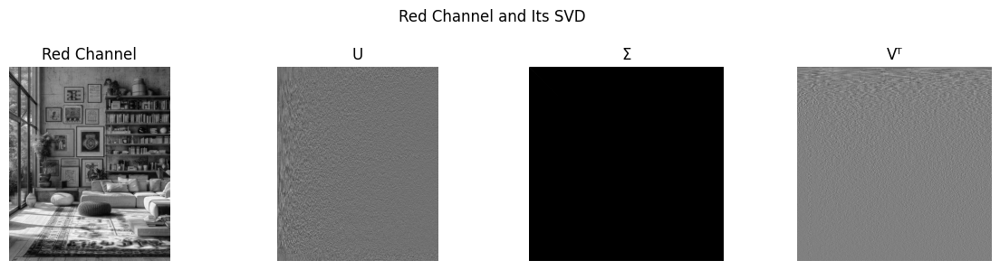

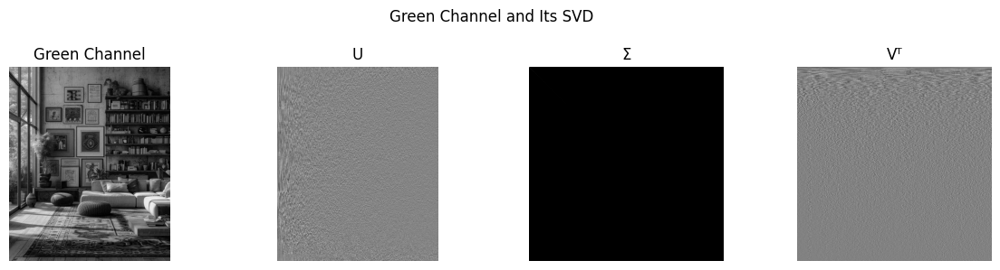

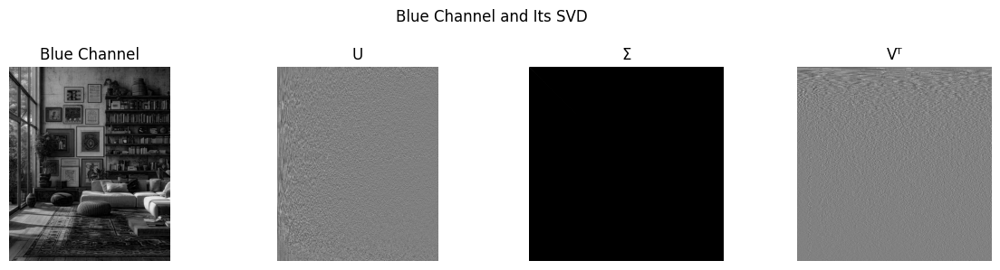

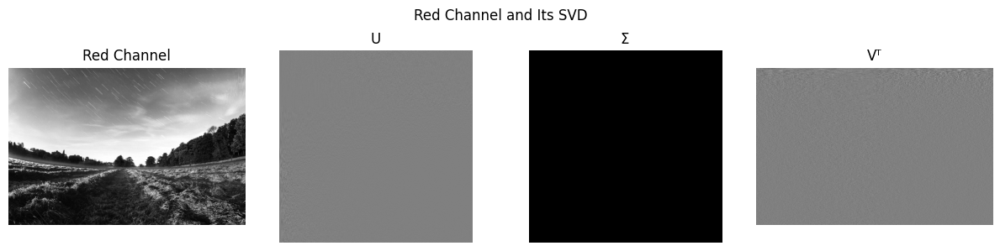

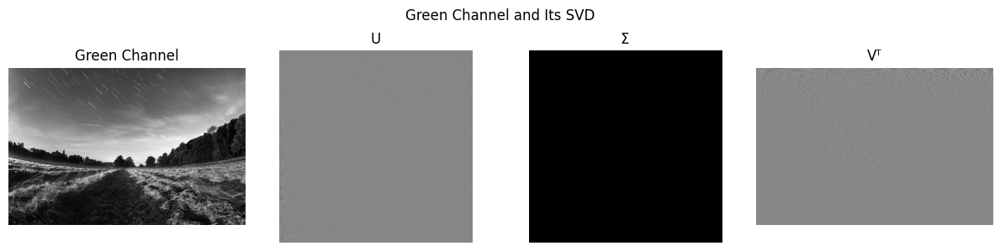

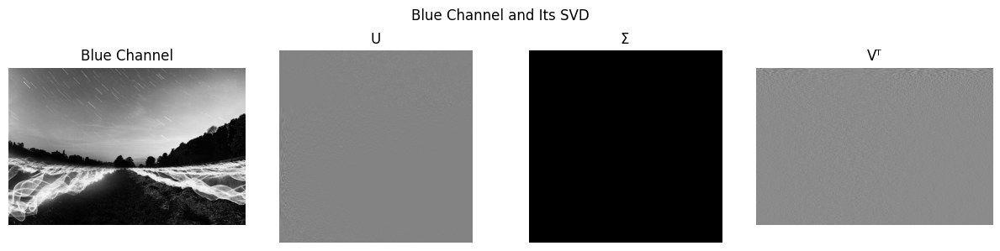

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the image
image_path = r"C:\Users\ads\Downloads\home.bmp"
img = mpimg.imread(image_path)
if img.dtype != np.float32 and img.max() > 1:
    img = img / 255.0  # Normalize to [0, 1] if needed

# Separate RGB channels
R = img[:, :, 0]
G = img[:, :, 1]
B = img[:, :, 2]

# Function to compute and normalize SVD components for display
def compute_and_normalize_svd(channel):
    U, S, VT = np.linalg.svd(channel, full_matrices=False)
    Sigma = np.zeros((U.shape[1], VT.shape[0]))
    np.fill_diagonal(Sigma, S)

    U_disp = (U - U.min()) / (U.max() - U.min())
    Sigma_disp = (Sigma - Sigma.min()) / (Sigma.max() - Sigma.min())
    VT_disp = (VT - VT.min()) / (VT.max() - VT.min())

    return U_disp, Sigma_disp, VT_disp

# Compute for each channel
UR, SR, VTR = compute_and_normalize_svd(R)
UG, SG, VTG = compute_and_normalize_svd(G)
UB, SB, VTB = compute_and_normalize_svd(B)

# Function to show channel and its SVD parts
def plot_channel_svd(channel_name, original, U, S, VT):
    plt.figure(figsize=(12, 3))
    plt.suptitle(f"{channel_name} Channel and Its SVD")

    plt.subplot(1, 4, 1)
    plt.imshow(original, cmap='gray')
    plt.title(f"{channel_name} Channel")
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(U, cmap='gray')
    plt.title("U")
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(S, cmap='gray')
    plt.title("Σ")
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(VT, cmap='gray')
    plt.title("Vᵀ")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Plot each channel
plot_channel_svd("Red", R, UR, SR, VTR)
plot_channel_svd("Green", G, UG, SG, VTG)
plot_channel_svd("Blue", B, UB, SB, VTB)

#for the second image
# Load the image
image_path = r"C:\Users\ads\Downloads\sample_1920×1280.bmp"
img = mpimg.imread(image_path)
if img.dtype != np.float32 and img.max() > 1:
    img = img / 255.0  # Normalize to [0, 1] if needed

# Separate RGB channels
R = img[:, :, 0]
G = img[:, :, 1]
B = img[:, :, 2]

# Function to compute and normalize SVD components for display
def compute_and_normalize_svd(channel):
    U, S, VT = np.linalg.svd(channel, full_matrices=False)
    Sigma = np.zeros((U.shape[1], VT.shape[0]))
    np.fill_diagonal(Sigma, S)

    U_disp = (U - U.min()) / (U.max() - U.min())
    Sigma_disp = (Sigma - Sigma.min()) / (Sigma.max() - Sigma.min())
    VT_disp = (VT - VT.min()) / (VT.max() - VT.min())

    return U_disp, Sigma_disp, VT_disp

# Compute for each channel
UR, SR, VTR = compute_and_normalize_svd(R)
UG, SG, VTG = compute_and_normalize_svd(G)
UB, SB, VTB = compute_and_normalize_svd(B)

# Function to show channel and its SVD parts
def plot_channel_svd(channel_name, original, U, S, VT):
    plt.figure(figsize=(12, 3))
    plt.suptitle(f"{channel_name} Channel and Its SVD")

    plt.subplot(1, 4, 1)
    plt.imshow(original, cmap='gray')
    plt.title(f"{channel_name} Channel")
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(U, cmap='gray')
    plt.title("U")
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(S, cmap='gray')
    plt.title("Σ")
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(VT, cmap='gray')
    plt.title("Vᵀ")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Plot each channel
plot_channel_svd("Red", R, UR, SR, VTR)
plot_channel_svd("Green", G, UG, SG, VTG)
plot_channel_svd("Blue", B, UB, SB, VTB)


### 2.3 compressing the image

Since eigenvalues in the decomposition are sorted in descending order, we can approximate the original array by keeping only the first $k$ columns of $U$, first $k$ rows and columns of $\Sigma$, and first $k$ rows of $V^T$.
Select $k$ to be (5, 10, 20, 30, 50, 100, 200, 250) and approximate the original array using the truncated SVD. Show the approximated image titled with the value of $k$.

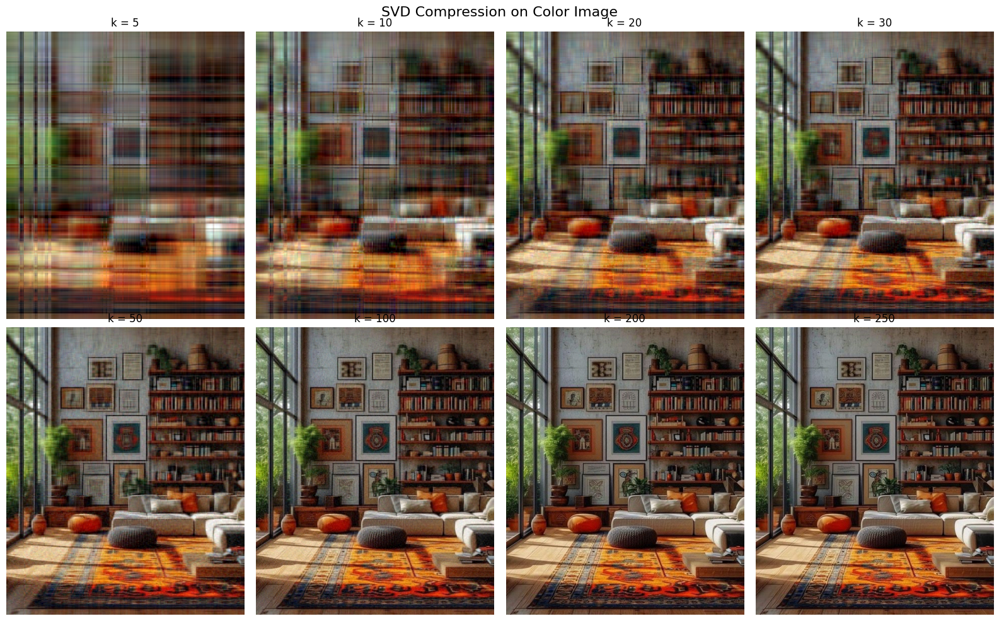

In [7]:
# Code cell
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
#file address
image_path = r"C:\Users\ads\Downloads\home.bmp"
img = Image.open(image_path).convert("RGB")
img_array = np.array(img)


def reconstruct_color_image(img_array, k):
    channels = []
    for c in range(3):  # R, G, B
        U, S, VT = np.linalg.svd(img_array[:, :, c], full_matrices=False)
        S_k = np.diag(S[:k])
        U_k = U[:, :k]
        VT_k = VT[:k, :]
        channel_recon = np.clip(U_k @ S_k @ VT_k, 0, 255)
        channels.append(channel_recon.astype(np.uint8))
    return np.stack(channels, axis=2)

# k
ks = [5, 10, 20, 30, 50, 100, 200, 250]

# plot
plt.figure(figsize=(16, 10))
for i, k in enumerate(ks):
    approx_img = reconstruct_color_image(img_array, k)
    plt.subplot(2, 4, i+1)
    plt.imshow(approx_img)
    plt.title(f'k = {k}')
    plt.axis('off')

plt.suptitle("SVD Compression on Color Image", fontsize=16)
plt.tight_layout()
plt.show()


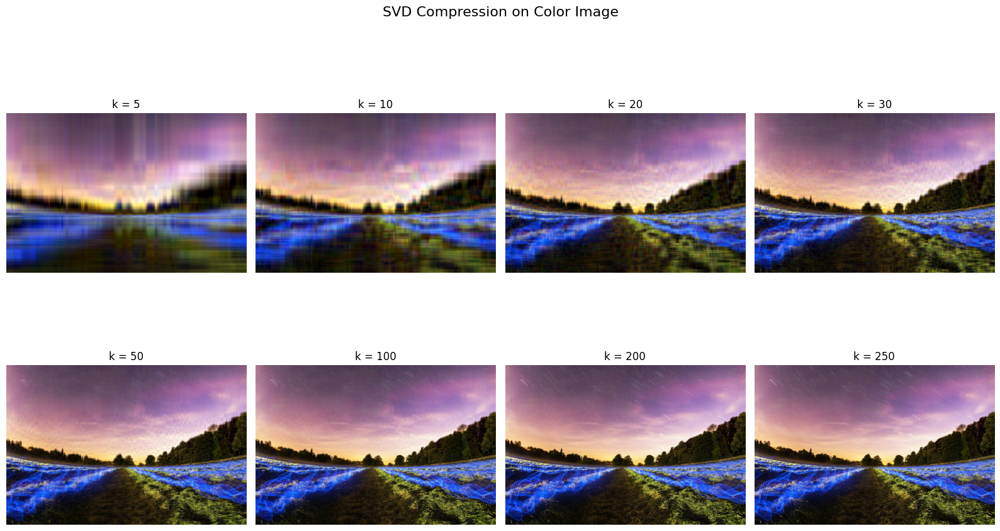

In [8]:
# Code cell
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
#file address
image_path = r"C:\Users\ads\Downloads\sample_1920×1280.bmp"
img = Image.open(image_path).convert("RGB")
img_array = np.array(img)


def reconstruct_color_image(img_array, k):
    channels = []
    for c in range(3):  # R, G, B
        U, S, VT = np.linalg.svd(img_array[:, :, c], full_matrices=False)
        S_k = np.diag(S[:k])
        U_k = U[:, :k]
        VT_k = VT[:k, :]
        channel_recon = np.clip(U_k @ S_k @ VT_k, 0, 255)
        channels.append(channel_recon.astype(np.uint8))
    return np.stack(channels, axis=2)

# k
ks = [5, 10, 20, 30, 50, 100, 200, 250]

# plot
plt.figure(figsize=(16, 10))
for i, k in enumerate(ks):
    approx_img = reconstruct_color_image(img_array, k)
    plt.subplot(2, 4, i+1)
    plt.imshow(approx_img)
    plt.title(f'k = {k}')
    plt.axis('off')

plt.suptitle("SVD Compression on Color Image", fontsize=16)
plt.tight_layout()
plt.show()


#### Explain your results.

Explain the relationship between the number of components and the level of compression in the images. How does the image quality change with increasing values of k?


answer:

The qulality gets higher as k increases.

### 2.4 variance

There is no need to store $U$ and $V$ matrices. Instead, we can store $\Sigma$ and two other matrices of size $n × k$ and $m × k$. Using $\Sigma$ display the plots below. To not compress the image based on a given random number k, we are required to do some math & statistics

1. The plot "Component Importance" shows the  amount  of variance each component carries. The first component preserves the highest variance, then the second, and so on.
2. The plot shows the explained variance as a function of numbers, using this technique you can choose how much the image, relative to its original size gets compressed.

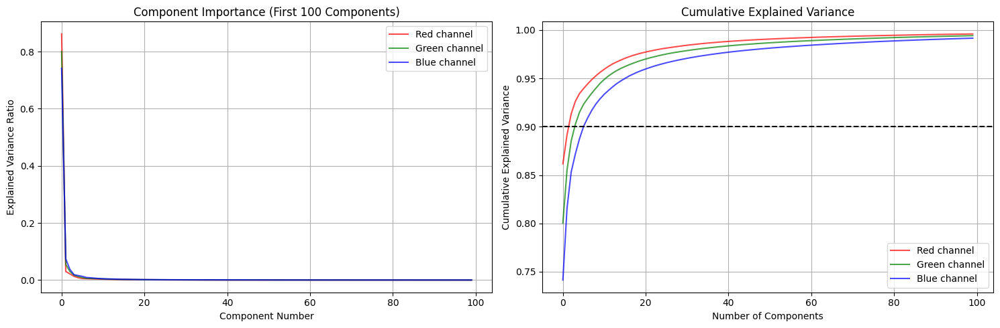

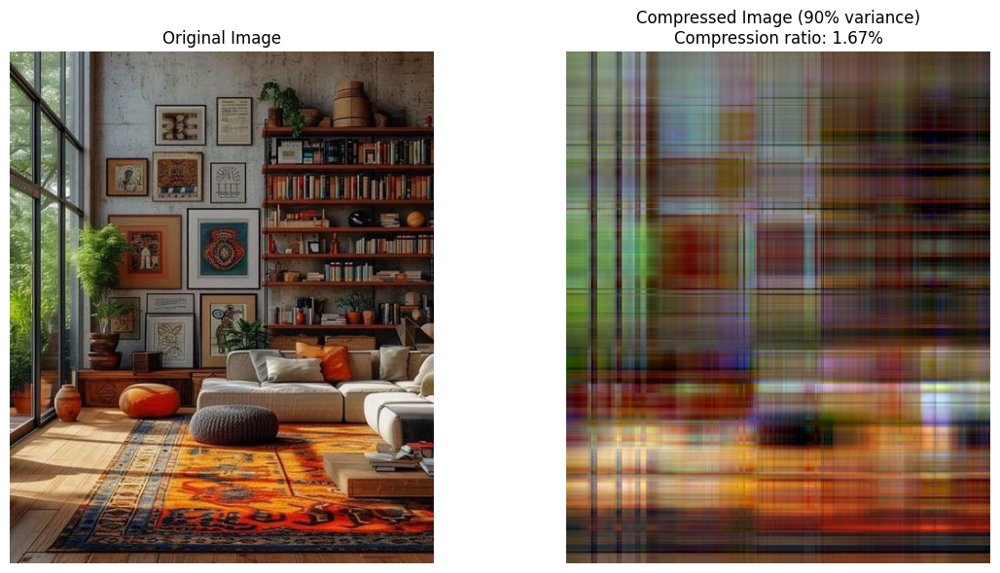

In [9]:
# Code cell
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def svd_compression(image_path, variance_threshold=0.9):
    # Load image and separate channels
    img = mpimg.imread(image_path)
    r, g, b = img[:, :, 0], img[:, :, 1], img[:, :, 2]
    
    # Initialize dictionaries to store results
    channels = {'Red': r, 'Green': g, 'Blue': b}
    results = {}
    
    # Process each channel
    for name, channel in channels.items():
        U, S, Vt = np.linalg.svd(channel, full_matrices=False)
        total_variance = np.sum(S**2)
        
        # Calculate cumulative explained variance
        explained_variance = (S**2) / total_variance
        cumulative_variance = np.cumsum(explained_variance)
        
        # Find optimal k for 90% variance
        k = np.argmax(cumulative_variance >= variance_threshold) + 1
        
        # results
        results[name] = {
            'U': U, 'S': S, 'Vt': Vt,
            'explained_variance': explained_variance,
            'cumulative_variance': cumulative_variance,
            'optimal_k': k
        }
    
    # Plot 
    plt.figure(figsize=(15, 5))
    colors = ['red', 'green', 'blue']
    
    for i, (name, color) in enumerate(zip(results.keys(), colors)):
        plt.subplot(1, 2, 1)
        plt.plot(results[name]['explained_variance'][:100], 
                color=color, alpha=0.7, label=f'{name} channel')
        
        plt.subplot(1, 2, 2)
        plt.plot(results[name]['cumulative_variance'][:100],
                color=color, alpha=0.7, label=f'{name} channel')
    
    plt.subplot(1, 2, 1)
    plt.title('Component Importance (First 100 Components)')
    plt.xlabel('Component Number')
    plt.ylabel('Explained Variance Ratio')
    plt.legend()
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    plt.title('Cumulative Explained Variance')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.axhline(y=variance_threshold, color='black', linestyle='--')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    # Reconstruct compressed image
    compressed_channels = []
    for name in ['Red', 'Green', 'Blue']:
        data = results[name]
        U_k = data['U'][:, :data['optimal_k']]
        S_k = np.diag(data['S'][:data['optimal_k']])
        Vt_k = data['Vt'][:data['optimal_k'], :]
        
        compressed_channel = U_k @ S_k @ Vt_k
        compressed_channel = np.clip(compressed_channel, 0, 255)  # Ensure valid pixel values
        compressed_channels.append(compressed_channel)
    
    compressed_img = np.stack(compressed_channels, axis=-1)
    
    # Calculate compression ratio
    original_size = img.size
    compressed_size = sum([data['optimal_k']*(img.shape[0] + img.shape[1] + 1) for data in results.values()])
    ratio = compressed_size / original_size
    
    # Plot comparison
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(compressed_img.astype(np.uint8))
    plt.title(f'Compressed Image (90% variance)\nCompression ratio: {ratio:.2%}')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return compressed_img

# Usage
image_path = r"C:\Users\ads\Downloads\home.bmp"  # Replace with your path
compressed_image = svd_compression(image_path, variance_threshold=0.9)

Compress the image with 90% of its explained variance ratio and show the result image.

In [ ]:
# Code cell
#the code is contained in the last cell

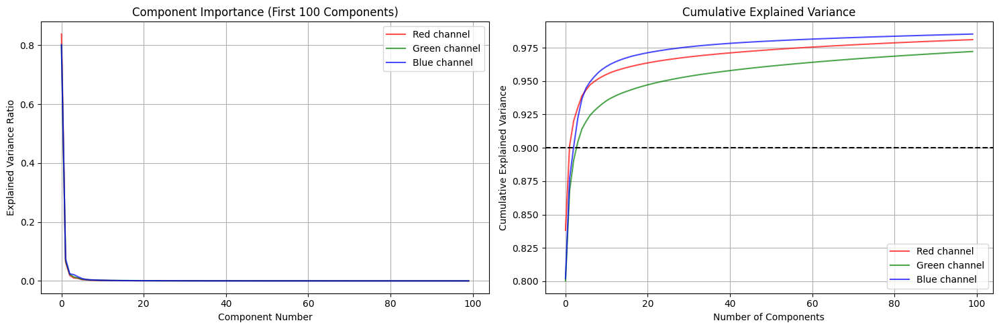

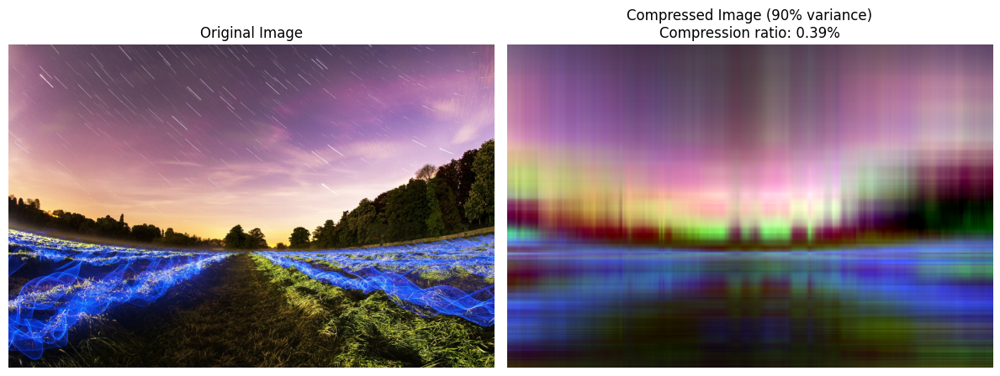

In [10]:
#for the second image:
# Code cell
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def svd_compression(image_path, variance_threshold=0.9):
    # Load image and separate channels
    img = mpimg.imread(image_path)
    r, g, b = img[:, :, 0], img[:, :, 1], img[:, :, 2]
    
    # Initialize dictionaries to store results
    channels = {'Red': r, 'Green': g, 'Blue': b}
    results = {}
    
    # Process each channel
    for name, channel in channels.items():
        U, S, Vt = np.linalg.svd(channel, full_matrices=False)
        total_variance = np.sum(S**2)
        
        # Calculate cumulative explained variance
        explained_variance = (S**2) / total_variance
        cumulative_variance = np.cumsum(explained_variance)
        
        # Find optimal k for 90% variance
        k = np.argmax(cumulative_variance >= variance_threshold) + 1
        
        # results
        results[name] = {
            'U': U, 'S': S, 'Vt': Vt,
            'explained_variance': explained_variance,
            'cumulative_variance': cumulative_variance,
            'optimal_k': k
        }
    
    # Plot 
    plt.figure(figsize=(15, 5))
    colors = ['red', 'green', 'blue']
    
    for i, (name, color) in enumerate(zip(results.keys(), colors)):
        plt.subplot(1, 2, 1)
        plt.plot(results[name]['explained_variance'][:100], 
                color=color, alpha=0.7, label=f'{name} channel')
        
        plt.subplot(1, 2, 2)
        plt.plot(results[name]['cumulative_variance'][:100],
                color=color, alpha=0.7, label=f'{name} channel')
    
    plt.subplot(1, 2, 1)
    plt.title('Component Importance (First 100 Components)')
    plt.xlabel('Component Number')
    plt.ylabel('Explained Variance Ratio')
    plt.legend()
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    plt.title('Cumulative Explained Variance')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.axhline(y=variance_threshold, color='black', linestyle='--')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    # Reconstruct compressed image
    compressed_channels = []
    for name in ['Red', 'Green', 'Blue']:
        data = results[name]
        U_k = data['U'][:, :data['optimal_k']]
        S_k = np.diag(data['S'][:data['optimal_k']])
        Vt_k = data['Vt'][:data['optimal_k'], :]
        
        compressed_channel = U_k @ S_k @ Vt_k
        compressed_channel = np.clip(compressed_channel, 0, 255)  # Ensure valid pixel values
        compressed_channels.append(compressed_channel)
    
    compressed_img = np.stack(compressed_channels, axis=-1)
    
    # Calculate compression ratio
    original_size = img.size
    compressed_size = sum([data['optimal_k']*(img.shape[0] + img.shape[1] + 1) for data in results.values()])
    ratio = compressed_size / original_size
    
    # Plot comparison
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(compressed_img.astype(np.uint8))
    plt.title(f'Compressed Image (90% variance)\nCompression ratio: {ratio:.2%}')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return compressed_img

# Usage
image_path = r"C:\Users\ads\Downloads\sample_1920×1280.bmp"  # Replace with your path
compressed_image = svd_compression(image_path, variance_threshold=0.9)

# **Problem 3: PCA and its applications** ``(50 pt.)``

---


Principal Component Analysis (PCA) is a statistical technique commonly used in data analysis and machine learning for dimensionality reduction while preserving as much variance as possible. It helps in identifying patterns in data based on the correlation between features. The goal of PCA is to reduce the number of variables of a data set, while preserving as much information (variance) as possible.

---

### Step 1: Standardize the Dataset
Normalize each feature in the dataset to have zero mean and unit variance to ensure each feature contributes equally:

\begin{align}
z_i = \frac{(x_i - \mu)}{\sigma}
\end{align}

### Step 2: Compute the Covariance Matrix
Construct a covariance matrix to analyze how features vary from the mean with respect to each other, which helps in identifying correlated features:

\begin{align}
C = \frac{1}{n-1} \times (X^T X)
\end{align}

where \( X \) is the standardized data matrix.

### Step 3: Calculate Eigenvalues and Eigenvectors
Solve for eigenvalues and their corresponding eigenvectors of the covariance matrix; these will determine the new axes (principal components) for the data projection:

\begin{align}
Cv = \lambda v
\end{align}

### Step 4: Sort Eigenvalues and Eigenvectors
Order the eigenvalues from largest to smallest and rank the eigenvectors accordingly. This ranking indicates the relative significance of each principal component.

### Step 5: Project Data onto Principal Components
Transform the original dataset into a new coordinate system by projecting it onto the principal eigenvectors, reducing dimensionality while retaining most of the variance:

\begin{align}
Y = XW
\end{align}

Here, \( W \) is the matrix containing the selected eigenvectors, and \( Y \) is the transformed data matrix. This final transformation results in a new dataset that highlights the most significant relationships within the original data.

---
In the section below, import all the libraries you need:

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_iris 

The MNIST dataset is a large collection of handwritten digits commonly used for training various image processing systems. It contains 70,000 images of handwritten digits from 0 to 9, each represented as a 28x28 pixel grayscale image.

load the dataset and show the first 50 samples:

In [1]:
#load the data set and fill nan value with 0
from keras.datasets import mnist
(x_train, y_train), (x_test, y_test) = mnist.load_data()


11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 24s 2us/step


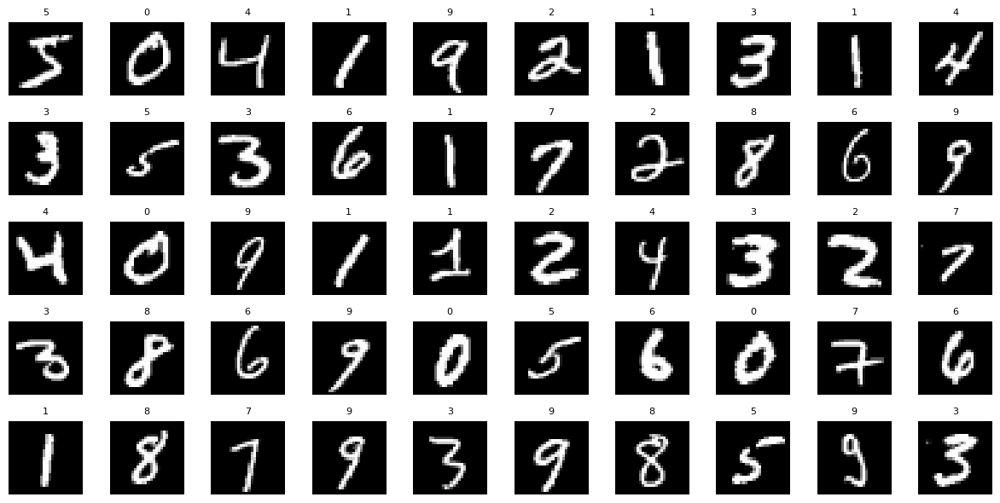

In [2]:
import matplotlib.pyplot as plt
import numpy as np

x_train = np.nan_to_num(x_train)

plt.figure(figsize=(12, 6))
for i in range(50):
    plt.subplot(5, 10, i + 1)
    plt.imshow(x_train[i], cmap='gray')
    plt.title(str(y_train[i]), fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()

PCA is affected by scale, so you need to do some normalization on data before applying PCA.

1- Reshape the data from a 28x28 matrix to a flattened 784-element vector.

2- Subtract the mean and divide by the standard deviation for each sample.


In [3]:
x_flat = x_train.reshape((x_train.shape[0], -1))
mean = np.mean(x_flat, axis=0)
std = np.std(x_flat, axis=0)
std[std == 0] = 1
x_normalized = (x_flat - mean) / std

In this section, first obtain the covariance matrix of the data and then extract its eigenvalues and eigenvectors. Finally, sort the eigenvalues and their corresponding eigenvectors from largest to smallest.

In [4]:
# Code cell
cov_matrix = np.cov(x_normalized.T)
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)
sorted_indices = np.argsort(eigenvalues)[::-1]
eigenvalues_sorted = eigenvalues[sorted_indices]
eigenvectors_sorted = eigenvectors[:, sorted_indices]

Now, we want to examine how many components can represent 75 percent of the total variance of the data. Note that the variance of each component corresponds to its eigenvalue.

In [5]:
# Code cell
total_variance = np.sum(eigenvalues_sorted)
explained_variance_ratio = eigenvalues_sorted / total_variance
cumulative_variance = np.cumsum(explained_variance_ratio)
k_75 = np.argmax(cumulative_variance >= 0.75) + 1
print(f"Number of components needed to preserve 75% variance: {k_75}")

Number of components needed to preserve 75% variance: 120


Now in this section, project the available data onto these components, perform dimensionality reduction, and then return the dimensions to the size of the original images. Draw an image of one of the samples for both states: before dimension reduction on the components and after it.

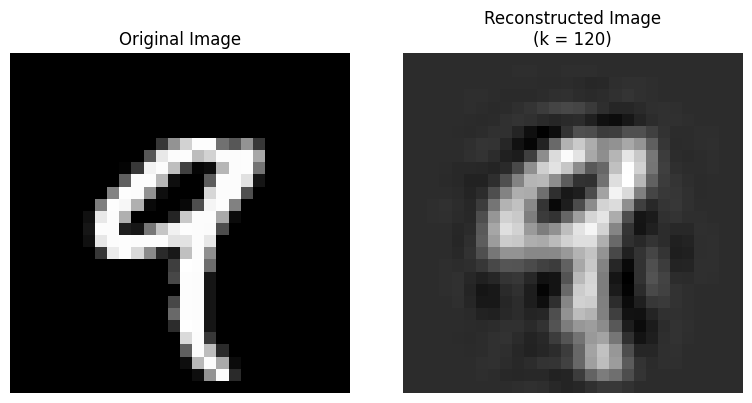

In [6]:
# Code cell
import matplotlib.pyplot as plt

W = eigenvectors_sorted[:, :k_75]
x_pca = x_normalized @ W
x_reconstructed = x_pca @ W.T
x_reconstructed_original = (x_reconstructed * std) + mean

sample_index = 4
original_image = x_flat[sample_index].reshape(28, 28)
reconstructed_image = x_reconstructed_original[sample_index].reshape(28, 28)

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(original_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(reconstructed_image, cmap='gray')
plt.title(f"Reconstructed Image\n(k = {k_75})")
plt.axis('off')

plt.tight_layout()
plt.show()

In this section, define a classifier such as SVM or RandomForest, and use the test and training data to determine the accuracy of the classifier. Repeat this process for different numbers of components and examine the impact of increasing the number of components on accuracy. Note that in this section, you can use built-in functions for performing PCA and classification. Additionally, identify which number of components results in the best accuracy.

In [7]:
# define a function that calculate PCA
def do_pca(n_components, data):

  pass

In [8]:
#define a function that gets the X data and Y labels and returns the accuracy of ml model.
def ML_model(X, y, print_output=True):

  passm

In [ ]:
#your code to plot the accuracy of projected train data on one ml model(choose on your own reggression , random forest , ...)
#consider number of component from 2 to 101 and calculate accuracy based on number of components